In [1]:
# Preliminary data notebook for
# NIH: Imaging Guided Intervention Surgery Study Section

# Exploratory aim: evaluate presurgical scans between STN and GPi targets
#   Given retrospective GPi acquisitions?
#   Search for radiomic differentiators for STN versus GPi selection in presurgical scans

In [2]:
# Import libraries
from radiomics import featureextractor
from time import time
import matplotlib.pyplot as plt
import numpy.matlib
from mpl_toolkits.axes_grid1 import make_axes_locatable
import nibabel as nib
from sklearn.preprocessing import StandardScaler
import SimpleITK as sitk
import six
import trimesh
import numpy as np
from numpy import linalg
import os
import pywt
import pickle
import sys
from scipy.stats import linregress
import pandas as pd
import nrrd
from util import plot_correlation_heatmap

%matplotlib widget

In [3]:
plt.style.use('dark_background')
plt.rcParams["figure.figsize"] = (25,5)
def remove_keymap_conflicts(new_keys_set):
    for prop in plt.rcParams:
        if prop.startswith('keymap.'):
            keys = plt.rcParams[prop]
            remove_list = set(keys) & new_keys_set
            for key in remove_list:
                keys.remove(key)

def multi_slice_viewer(volume):
    remove_keymap_conflicts({'j', 'k'})
    fig, ax = plt.subplots()
    ax.volume = volume
    ax.index = volume.shape[0]//2
    ax.imshow(volume[ax.index])
    fig.canvas.mpl_connect('key_press_event', process_key)

def process_key(event):
    fig = event.canvas.figure
    ax = fig.axes[0]
    if event.key == 'j':
        previous_slice(ax)
    elif event.key == 'k':
        next_slice(ax)
    fig.canvas.draw()
    

def previous_slice(ax):
    volume = ax.volume
    ax.index = (ax.index-1) % volume.shape[0] 
    ax.images[0].set_array(volume[ax.index])

def next_slice(ax):
    volume = ax.volume
    ax.index = (ax.index+1) % volume.shape[0]
    ax.images[0].set_array(volume[ax.index])

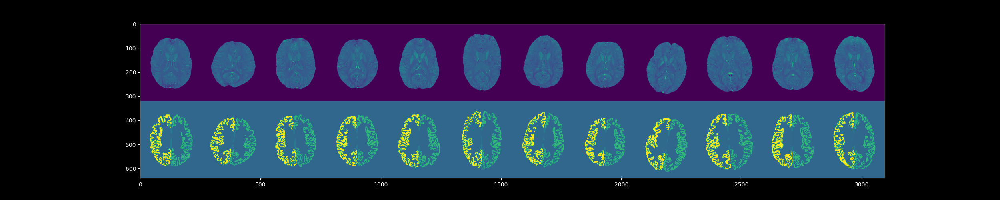

In [4]:
# Set window level
level = 0
window = 0.5
m1=level-window/2
m2=level+window/2
visualize = 1
suf = 'us'
# Load data
segs = []
qsms_fs = []
qsms_us = []
voxel_sizes = []
trackers = []
dir = '/media/mts_dbs/mclaro/nii/'
files = os.listdir(dir)
case_ids = [9,10,11,12,13]
n_cases = len(case_ids)
for j in np.arange(n_cases):
    seg = nib.load(dir+'T1w_sub='+str(case_ids[j])+'_seg.nii')
    voxel_size = seg.header['pixdim'][0:3]
    voxel_sizes.append(voxel_size)
    segs.append(np.asarray(seg.get_fdata()))
    qsm_fs = nib.load(dir+'QSM_full_'+str(case_ids[j])+'.nii')
    qsm_us = nib.load(dir+'QSM_us_'+str(case_ids[j])+'.nii')
    qsm_wl = qsm_fs.get_fdata()
    qsm_wl[qsm_wl<m1] = m1
    qsm_wl[qsm_wl>m2] = m2
    qsms_fs.append(np.asarray(qsm_fs.get_fdata()))
    qsms_us.append(np.asarray(qsm_us.get_fdata()))


if visualize == 1:
        multi_slice_viewer(np.hstack((np.vstack(qsms_fs).T,np.vstack(segs).T/4000)))


In [5]:
# Only extract ROI if it is present in all cases
seg_labels_all = segs[0]
for i in range(n_cases-1):
    seg_labels = np.intersect1d(segs[i],segs[i+1])
    seg_labels_all = np.intersect1d(seg_labels_all,seg_labels)

In [6]:
# Generate feature structure Phi from all ROIs and all cases
extractor = featureextractor.RadiomicsFeatureExtractor()
extractor.enableAllFeatures()
extractor.enableAllImageTypes()
extractor.enableFeatureClassByName('shape2D',enabled = False)

In [7]:
Phi_fs = []
Phi_us = []
seg_labels = []
reextract = 0
x_row_fs = []
x_row_us = []
keylib = []
roilib = []
loop_count = 0
n_rois = seg_labels_all[seg_labels_all>0].__len__()
roi_names = []
roi_txt = pd.read_csv("/data/Ali/atlas/freesurfer/FsTutorial_AnatomicalROI_FreeSurferColorLUT.csv")
roi_df = roi_txt.iloc[:,0:2]
if reextract == 1:
    for i in range(n_cases):
        seg_sitk = sitk.GetImageFromArray(segs[i])
        seg_sitk.SetSpacing(voxel_sizes[i].tolist())
        qsm_sitk_fs = sitk.GetImageFromArray(qsms_fs[i])
        qsm_sitk_fs.SetSpacing(voxel_sizes[i].tolist())
        qsm_sitk_us = sitk.GetImageFromArray(qsms_us[i])
        qsm_sitk_us.SetSpacing(voxel_sizes[i].tolist())
        for j in seg_labels_all:
            if j>0:
                featureVector_fs = extractor.execute(qsm_sitk_fs,seg_sitk,label=int(j))
                Phi_fs.append(featureVector_fs)
                featureVector_us = extractor.execute(qsm_sitk_us,seg_sitk,label=int(j))
                Phi_us.append(featureVector_us)
                for key, value in six.iteritems(featureVector_fs):
                    if 'diagnostic' in key:
                        next
                    else:
                        x_row_fs.append(featureVector_fs[key])
                        x_row_us.append(featureVector_us[key])
                        keylib.append(key)
                        roilib.append(seg_labels_all[np.mod(loop_count,n_rois)])
                        mask = np.row_stack([roi_df[row].str.contains(str(int(roilib[-1])), na = False) for row in roi_df])
                        roi_names.append(np.asarray(roi_df.iloc[mask.any(axis=0),1])[0])
                        loop_count = loop_count+1
    
    X0_fs = np.array(x_row_fs)
    X0_us = np.array(x_row_us)
    np.save('X0_fs_rois.npy',X0_fs)
    np.save('X0_us_rois.npy',X0_us)
    K = np.asarray(keylib)
    np.save('K.npy',K)

    print('Saving fully sampled feature vector')
    with open('Phi_mcl_fs_roic', 'wb') as fp:  
        pickle.dump(Phi_fs, fp)

    print('Saving under sampled feature vector')
    with open('Phi_mcl_us_roic', 'wb') as fp:  
        pickle.dump(Phi_us, fp)
else:
    X0_fs = np.load('X0_fs_rois.npy')
    X0_us = np.load('X0_us_rois.npy')
    K = np.load('K.npy')
    

In [8]:
with open('Phi_mcl_fs_roi', "rb") as fp:  
    Phi_fs = pickle.load(fp)

In [9]:
with open('Phi_mcl_us_roi', "rb") as fp:  
    Phi_us = pickle.load(fp)

In [10]:
n_roisc = Phi_fs.__len__()/n_cases

In [11]:
L = int(len(X0_fs)/n_cases)
n_features = int(L/n_rois)

In [12]:
X0_fss = X0_fs.reshape((n_cases,n_features,n_rois))
X0_uss = X0_us.reshape((n_cases,n_features,n_rois))
K_rs = K.reshape((n_cases,n_features,n_rois))

In [13]:
Mc = np.zeros((X0_uss.shape[1],X0_uss.shape[2]))
Mi = np.zeros((X0_uss.shape[1],X0_uss.shape[2]))
Kc = np.empty((X0_uss.shape[1],X0_uss.shape[2]),dtype=object)

In [14]:
def ccc(X01,X02):
    sigma1 = np.std(X01,axis = 0)
    sigma2 = np.std(X02,axis = 0)
    mu1 = np.mean(X01,axis = 0)
    mu2 = np.mean(X02,axis = 0)
    cov = np.mean((X01-mu1)*(X02-mu2),axis = 0)
    rho = cov/(sigma1*sigma2)
    rhoc = (2*rho*sigma1*sigma2)/(sigma1**2+sigma2**2+(mu1-mu2)**2)
    print(rhoc)
    return rhoc

In [15]:
def icc(df):
    m = df.shape[0]
    k = df.shape[1]
    mu = np.nanmean(df)
    mu_j = df.mean(axis = 0)
    mu_i = df.mean(axis = 1)
    sT = (k/(m-1))*np.sum((mu-mu_i)**2)
    T = df
    sE = np.sum(np.sum((T-np.matlib.repmat(mu_i,k,1).T-np.matlib.repmat(mu_j,m,1)+mu)**2))/((m-1)*(k-1))
    rho = (sT-sE)/(sT+(k-1)*sE)
    print(rho)
    return rho

In [16]:
for i in np.arange(X0_fss.shape[1]):
    for j in np.arange(X0_fss.shape[2]):
        Mc[i,j] = ccc(X0_fss[:,i,j],X0_uss[:,i,j])
        Kc[i,j] = K_rs[1,i,j]

1.0
1.0000000000000002
1.0
1.0000000000000002
1.0
1.0
1.0
0.9999999999999999
1.0
1.0
0.9999999999999999
1.0
1.0
1.0000000000000002
0.7341931863746652
0.6993857607136552
2.9968819698429316e-05
0.4657639027110876
0.8144937817642043
-0.003240265544328717
nan
-0.00021765293365884518
0.009971692553422925
0.5155189476913584
nan
nan
0.8343644219259594
0.0004455332160938199
-0.015517411797164038
2.9968819698429306e-05
0.5659769609695239
1.9004751790609115e-05
0.001807924245524612
0.13068476011306504
0.4977817936702942
0.5395493081058726
0.6350032313190925
0.3576083953930564
0.6078122160887008
0.6298251524021725
0.640574751294741
0.5977148265103955
0.6018073669889857
0.034435016742033274
0.13214508220772514
0.2676440042942972
0.2988842899637555
0.5804384924082148
0.0014685376930815674
0.625265222729487
0.6017233438735439
0.09732477332479152
0.6332872068036013
0.001468537693081568
0.5954191681241539
0.5693568664101454
0.6202036889271411
0.830390876082311
0.6228732877213069
0.4282091997876975
0.8

/data/Ali/anaconda3/envs/pdradenv/lib/python3.7/site-packages/ipykernel_launcher.py:7: RuntimeWarning: invalid value encountered in double_scalars
  import sys


0.9573393613478342
0.955487004360976
0.06532059268596001
0.3318735414179864
0.5961989736939721
0.5761027026340105
0.1016331782729952
0.5682673240403748
0.7909568425178074
0.7127497889300973
0.9689722244891191
0.9982656856517247
0.9992503517932663
0.7216825758841559
0.7114722592009897
0.9992486847752974
0.7880028615746741
0.7638631188188935
0.49849910392475333
-0.06786810105652666
0.7940172284676752
0.36528092644221655
0.243725223961944
0.8710514562582244
0.9143214924174341
0.5573210808357673
0.2754565193921639
0.2347774713415406
0.7846734130550406
0.8868967383326782
0.4180741117432022
0.4984991039247533
-0.06785939135918383
0.8713841487050088
0.11330846215741758
0.1481130165298913
0.0731433295559938
0.14700548273325714
0.15112829209448944
0.14931990098788203
0.15112829209448944
0.0932060162917065
0.08755898841464141
0.15112829209449063
0.15112829209449063
0.1511282920944903
0.15112829209447323
0.09318161386348359
0.002402241791109297
0.15112829209448944
0.06579287892298386
0.0919763154

In [17]:
for i in np.arange(X0_fss.shape[1]):
    for j in np.arange(X0_fss.shape[2]):
        dataset = np.vstack((X0_fss[:,i,j],X0_uss[:,i,j]))
        Mi[i,j] = icc(dataset.T)

1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
1.0
0.7342040657240945
0.7225478951572525
0.00018653401997108905
0.5570695159427834
0.8660335131845445
-0.009409258911676212
0.0
-0.0010438752034377687
0.05327605994133316
0.5157452183591021
nan
0.0
0.8809620576191185
0.007174763334459263
-0.1488539021102521
0.00018653401997108907
0.5991385971099742
0.00010629709854989825
0.4974848909639003
0.2492919847838208
0.5091560807795347
0.5936902537095072
0.7407846821957277
0.698431070940203
0.7537706476523871
0.7439119093244119
0.7377776856494739
0.7578595920638057
0.7562391944295205
0.67463651736908
0.7640484181204805
0.7535380518473409
0.5097887407227767
0.7642264096229604
0.644426857195123
0.6285742230427155
0.6112678504816146
0.3397449183908457
0.6401941537965024
0.6444268571951223
0.608067736831402
0.6009703365020354
0.6232392057850714
0.9049686830125212
0.7656991747953351
0.7778169035424243
0.8366603797767311
0.5827792595817363
0.494777439816718
0.7757259653244335
0.6015859754310442
0.3

/data/Ali/anaconda3/envs/pdradenv/lib/python3.7/site-packages/ipykernel_launcher.py:10: RuntimeWarning: invalid value encountered in double_scalars
  # Remove the CWD from sys.path while we load stuff.


0.949914057789728
0.9224988187855198
0.8722407656480233
0.772301905643078
0.946957500905799
0.6808676406499363
0.4539316872224115
0.8692645639508721
0.15765996560606593
0.028751251555622515
0.4938672186259697
0.8435618154043802
0.816717358990491
0.3344793257423677
-0.22248798580777285
0.6530806147776673
-0.12174413794438683
-0.15122444806561014
0.05126901861681221
-0.023351054021939353
0.3687310768191569
0.6633599189528134
0.8444072606428544
0.16279657699030958
0.9832095717268293
0.18799137251840453
0.22384278671059132
0.2766170645124711
0.9525534046869351
0.9411227549620658
0.00011665770850981265
0.22099791807710453
0.9461880014699807
0.035594983977021814
0.062142136351734524
0.016399992682219925
0.01017347850564611
0.9271181361578781
0.053709994273675496
0.06652083588521612
0.9472544758409333
0.010489913714760025
0.3600798929666611
0.00011665770850982749
0.838960566179873
0.00012288074351752195
0.8826078700072129
0.1404815294941593
0.9892485361858351
0.8033425723699738
0.770053372583

In [18]:
np.sum(np.isnan(Mi))

18373

In [19]:
rho = Mc*Mi
Mc = Mc[~np.isnan(rho).any(axis = 1),:]
Mi = Mi[~np.isnan(rho).any(axis = 1),:]
Kc = Kc[~np.isnan(rho).any(axis = 1),:]
rhoc = Mc*Mi

In [20]:
np.sum(np.isnan(Mc))

0

In [21]:
Kcs = np.empty((Mc.shape[0],Mc.shape[1]),dtype=object)
im_type = np.empty((Mc.shape[0],Mc.shape[1]),dtype=object)
feat_class = np.empty((Mc.shape[0],Mc.shape[1]),dtype=object)

rhoc_exp = []
lbp_count = 0
log_count = 0
orig_count = 0
square_count = 0
squareroot_count = 0
wavelet_count = 0
for i in np.arange(Mc.shape[0]):
    for j in np.arange(Mc.shape[1]):
        feat_class[i,j] = Kc[i,j].rsplit('_',2)[1]
        im_type[i,j] = Kc[i,j].rsplit('_',2)[0]
        Kcs[i,j] = Kc[i,j].rsplit('_',1)[1]
        if im_type[i,j] == 'exponential':
            rhoc_exp.append(rhoc[i,j])
        if im_type[i,j] == 'lbp-3D-k':
            lbp_count = lbp_count+1
        if im_type[i,j] == 'logarithm':
            log_count = log_count+1
        if im_type[i,j] == 'original':
            orig_count = orig_count+1
        if im_type[i,j] == 'square':
            square_count = square_count+1
        if im_type[i,j] == 'squareroot':
            squareroot_count = squareroot_count+1
        if 'wavelet' in im_type[i,j]:
            wavelet_count = wavelet_count+1


In [22]:
rhoc_exp.__len__()

46

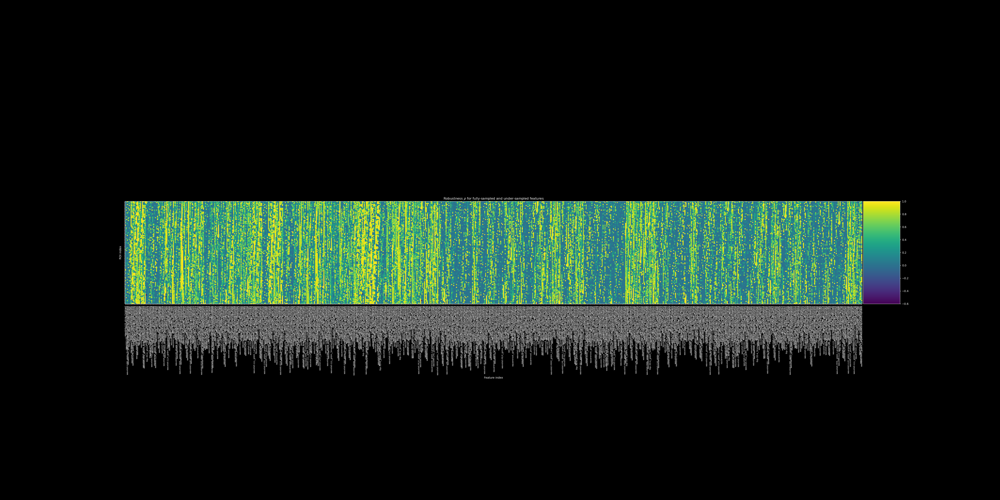

In [23]:
plt.close('all') 
fig, ax = plt.subplots(figsize = (50,25))
im = ax.imshow((Mc*Mi).T,interpolation='nearest')
ax.set_xlabel('Feature index')
ax.set_ylabel('ROI index')
plt.xticks(np.arange(Mc.shape[0]))
plt.yticks(np.arange(Mc.shape[1]))
ax.set_xticklabels(Kc[:,1], rotation='vertical', fontsize=8)
ax.set_yticklabels(roi_names[1:n_rois],rotation='horizontal',fontsize=8)
plt.title('Robustness $\\rho$ for fully-sampled and under-sampled features')
divider = make_axes_locatable(ax)
cax = divider.append_axes('right', size='5%', pad=0.05)
plt.colorbar(im, cax=cax, orientation='vertical')
plt.show()


In [24]:
def filter_keys(d, keys):
    return {k: v for k, v in d.items() if keys not in k}

In [25]:
def find_keys(d, keys):
    return {k: v for k, v in d.items() if keys in k}